# Setup

In [1]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [3]:
def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

# Example image

In [4]:
image = Image.open('../../videos/extracted/latop_open/00000.jpg')
image = np.array(image.convert("RGB"))

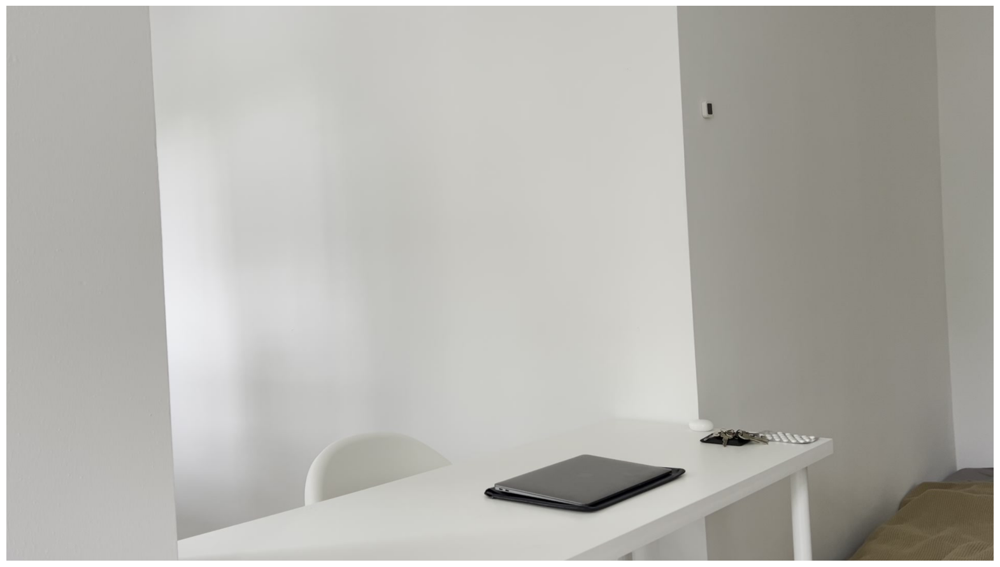

In [5]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.axis('off')
plt.show()

# Automatic mask generation

In [6]:
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

sam2_checkpoint = "../../segment-anything-2/checkpoints/sam2_hiera_tiny.pt"
model_cfg = "sam2_hiera_t.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

mask_generator = SAM2AutomaticMaskGenerator(
    sam2,
)

/vol/isy-rl/prj-rgbd2mesh/dtrofimov/segment-anything-2/sam2/modeling/sam/transformer.py:23: UserWarning: Flash Attention is disabled as it requires a GPU with Ampere (8.0) CUDA capability.
  OLD_GPU, USE_FLASH_ATTN, MATH_KERNEL_ON = get_sdpa_settings()


In [7]:
masks = mask_generator.generate(image)

In [8]:
print(len(masks))
print(masks[0].keys())

11
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


In [9]:
def get_masks_by_ids(masks, ids):
    return [masks[idx] for idx in ids]

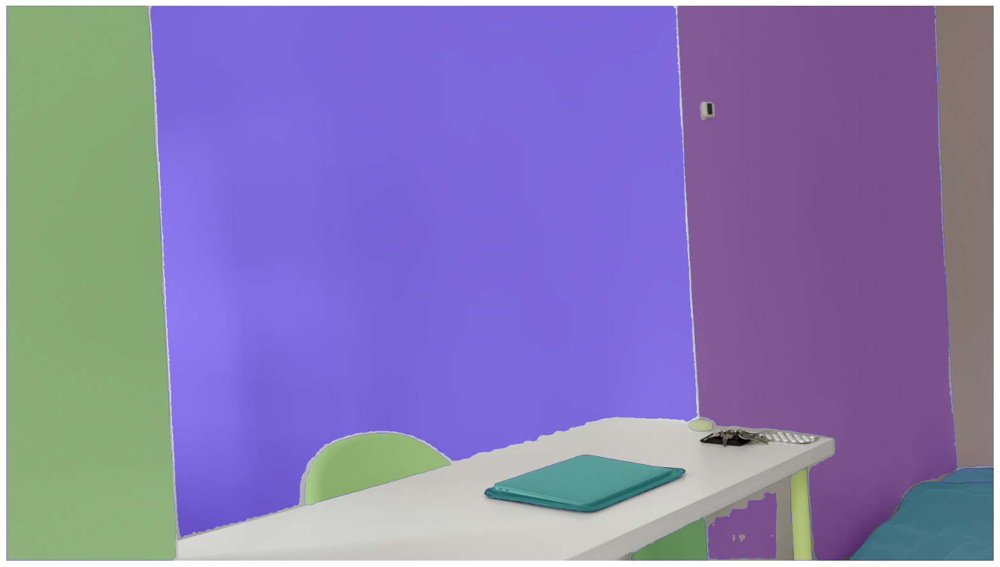

In [19]:
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

# Video propagation

In [20]:
import gc
del sam2
del mask_generator

torch.cuda.empty_cache()

# Force garbage collection to free up memory
gc.collect()

13326

In [21]:
from sam2.build_sam import build_sam2_video_predictor

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

In [22]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

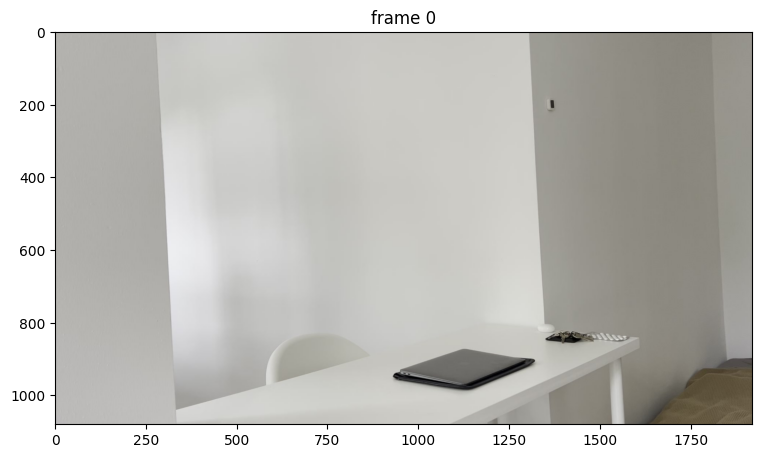

In [24]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "../../videos/extracted/latop_open/"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

In [25]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|████████████████████████████████████████| 351/351 [00:13<00:00, 25.50it/s]


In [26]:
predictor.reset_state(inference_state)

In [27]:
prompts = {} # For all points for vis

/vol/isy-rl/prj-rgbd2mesh/dtrofimov/segment-anything-2/sam2/sam2_video_predictor.py:873: UserWarning: cannot import name '_C' from 'sam2' (/vol/isy-rl/prj-rgbd2mesh/dtrofimov/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/segment-anything-2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(


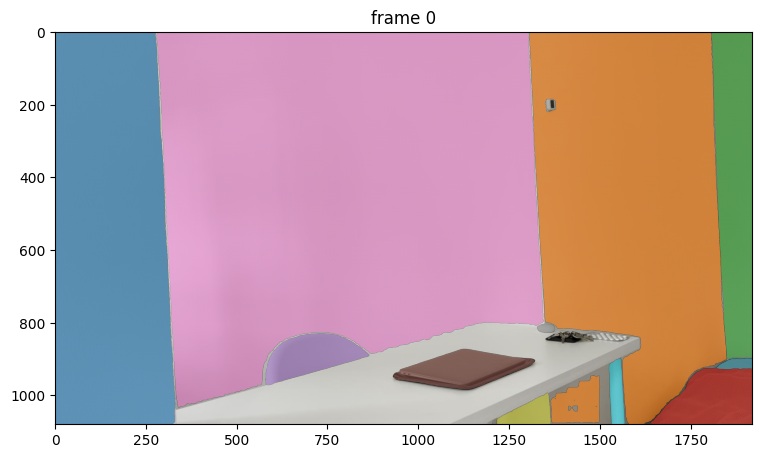

In [28]:
ann_frame_idx = 0
# Adding masks to the image
for ann_obj_id, mask in enumerate(masks):
    # `add_new_points_or_box` returns masks for all objects added so far on this interacted frame
    points = np.array(mask["point_coords"], dtype=np.float32)
    labels = np.array([1] * len(mask["point_coords"]), np.int32)
    _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
        inference_state=inference_state,
        frame_idx=ann_frame_idx,
        obj_id=ann_obj_id,
        points=points,
        labels=labels,
    )
    
# show the results on the current (interacted) frame on all objects
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
for i, out_obj_id in enumerate(out_obj_ids):
    #show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

In [33]:
def filter_segments_by_ids(vs, ids):
    return {
        idx: {i: dct[i] for i in ids}
        for idx, dct in vs.items()
    }

In [34]:
filter_segments_by_ids(video_segments, [5])

{0: {5: array([[[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]]])},
 1: {5: array([[[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]]])},
 2: {5: array([[[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, 

propagate in video: 100%|██████████████████████████████████████████| 351/351 [06:24<00:00,  1.09s/it]
/tmp/ipykernel_880206/2628699428.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 4))


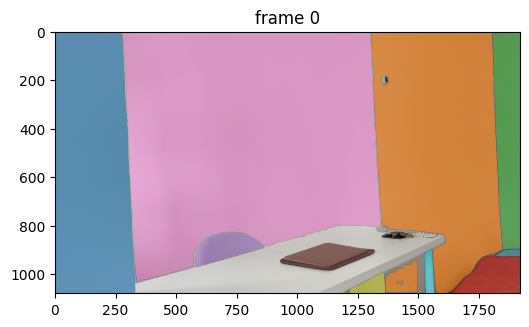

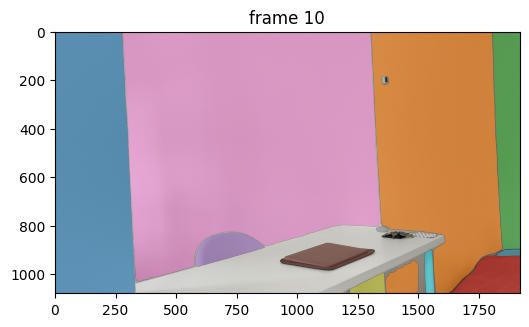

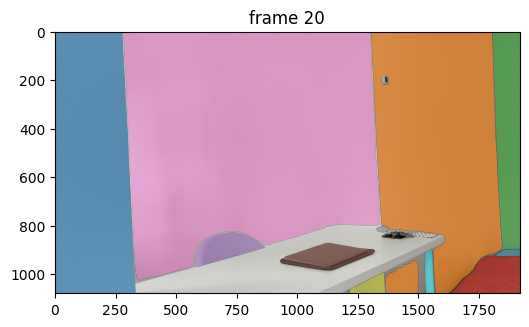

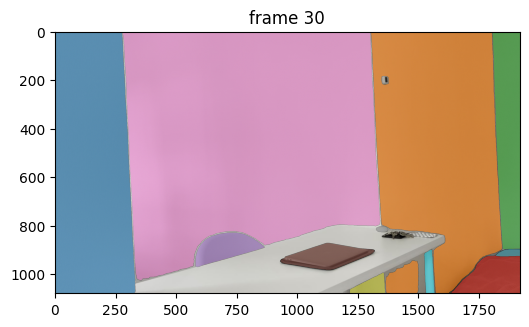

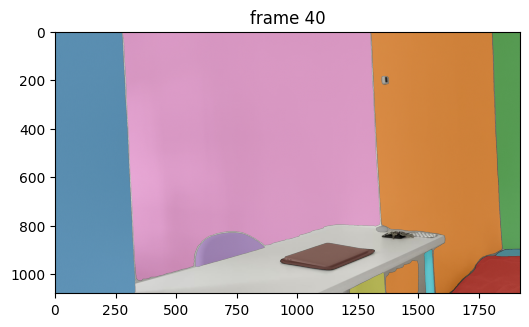

...

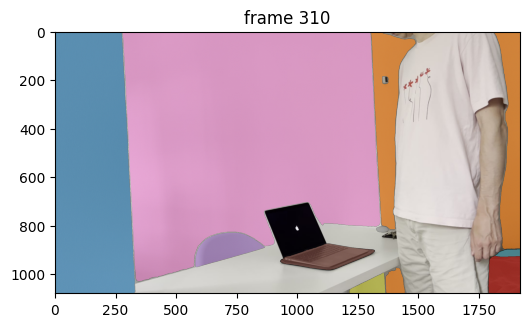

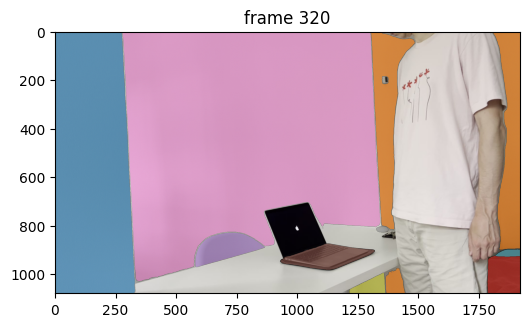

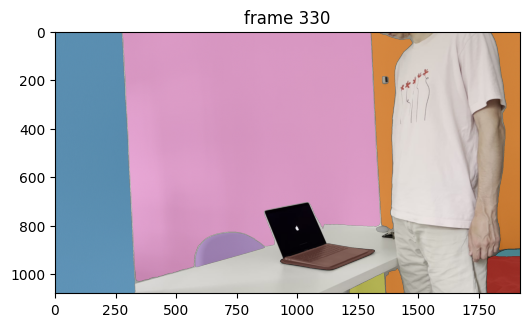

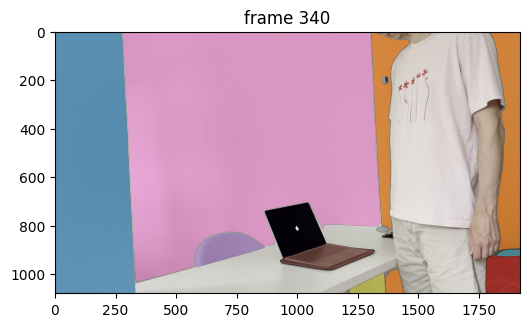

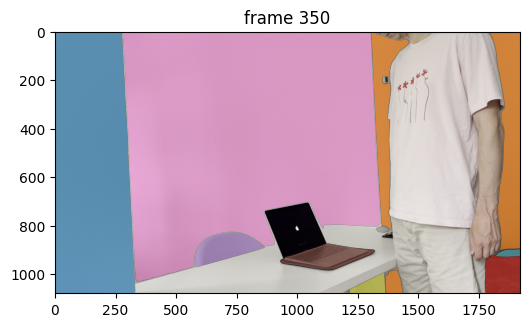

In [29]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

In [102]:
list(video_segments.keys())

[90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 195,
 196,
 197,
 198,
 199,
 200,
 201,
 202,
 203,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 223,
 224,
 225,
 226]

In [33]:
mask_mean(video_segments[0][0][0])

array([144.34625122, 586.23317153])

In [39]:
def mask_mean(mask: np.ndarray):
    """Returns the center of the mask"""
    y_indices, x_indices = np.where(mask)
    mean_y = np.mean(y_indices)
    mean_x = np.mean(x_indices)
    return np.array([mean_x, mean_y])

def mask_cumulative_movement(masks_means: list):
    means_start = masks_means[:-1]
    means_end = masks_means[1:]
    return sum(
        (((end - start) ** 2).sum() ** (1/2)) if (not np.any(np.isnan(end)) and not np.any(np.isnan(start))) else 0.0 
        for start, end in zip(means_start, means_end)
    )
    
def extract_bbox(mask):
    # Find the coordinates of the non-zero (True) points in the mask
    y_coords, x_coords = np.where(mask)
    
    # Calculate the bounding box
    if len(y_coords) == 0 or len(x_coords) == 0:
        # If the mask is empty, return an empty bounding box
        return None
    
    x_min = np.min(x_coords)
    x_max = np.max(x_coords)
    y_min = np.min(y_coords)
    y_max = np.max(y_coords)
    
    # Format the bounding box as (x, y, width, height)
    bbox = (x_min, y_min, x_max - x_min + 1, y_max - y_min + 1)
    
    return bbox

def calculate_bbox_displacement_with_area_check(bbox1, bbox2):
    if bbox1 is None or bbox2 is None:
        return 0.0
    x1, y1, w1, h1 = bbox1
    x2, y2, w2, h2 = bbox2

    # Displacement of the top-left corner only
    displacement_xy = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

    # Check if area has significantly decreased
    area1 = w1 * h1
    area2 = w2 * h2
    if area2 < 0.99 * area1:  # Example threshold: 20% reduction in area
        return 0  # Ignore this displacement as it might be due to occlusion

    # Change in width and height
    displacement_wh = np.abs(w2 - w1) + np.abs(h2 - h1)
    
    # Total displacement
    total_displacement = displacement_xy + displacement_wh
    return total_displacement

def calculate_sum_bbox_displacement(bboxes):
    bbox_start = bboxes[:-1]
    bbox_end = bboxes[1:]
    
    return sum(
        calculate_bbox_displacement_with_area_check(b1, b2) for b1, b2 in zip(bbox_start, bbox_end)
    )

In [40]:
from collections import defaultdict
masks_thr_frames = defaultdict(list)
for frame, masks in video_segments.items():
    for mask_idx, mask in masks.items():
        masks_thr_frames[mask_idx].append(mask)

In [41]:
mask_id2bbox = {mask_idx: list(map(lambda x: extract_bbox(x[0]), masks)) for mask_idx, masks in masks_thr_frames.items()}

In [42]:
{mask_id: calculate_sum_bbox_displacement(bboxes) for mask_id, bboxes in mask_id2bbox.items()}

{0: 38.0,
 1: 411.0,
 2: 28.0,
 3: 596.9289221986626,
 4: 284.30713578936525,
 5: 627.0031809593703,
 6: 1052.0,
 7: 269.16077363598174,
 8: 311.8901997215263,
 9: 551.0,
 10: 627.5012835243505}

In [134]:
masks[8]

{'segmentation': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 'area': 342620,
 'bbox': [496.0, 352.0, 760.0, 640.0],
 'predicted_iou': 0.9453125,
 'point_coords': [[870.0, 961.875]],
 'stability_score': 0.9593763947486877,
 'crop_box': [0.0, 0.0, 1920.0, 1080.0]}

/tmp/ipykernel_880206/1241013259.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 4))


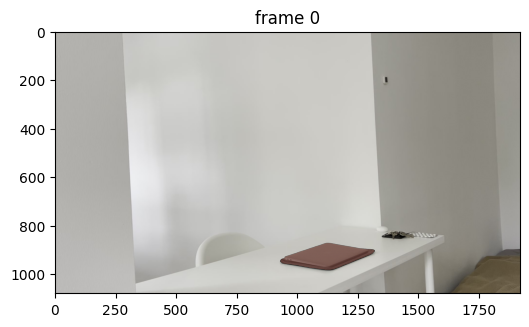

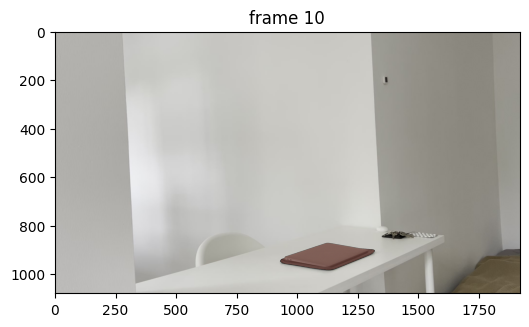

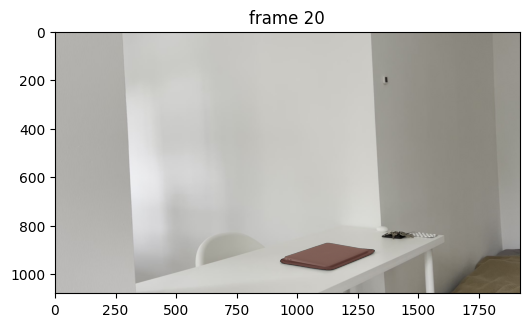

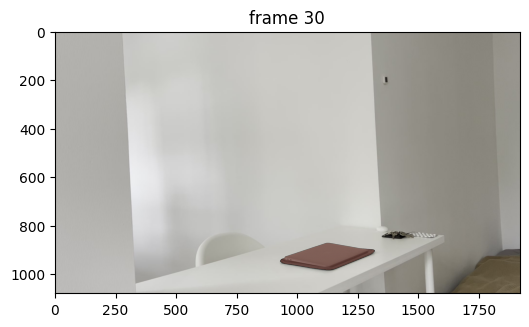

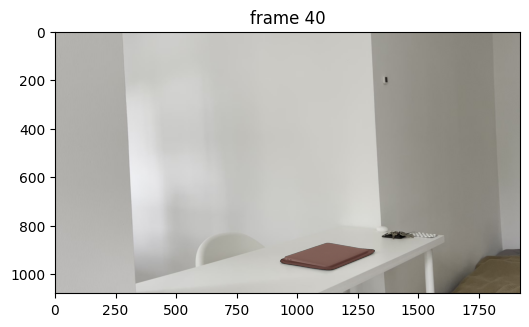

...

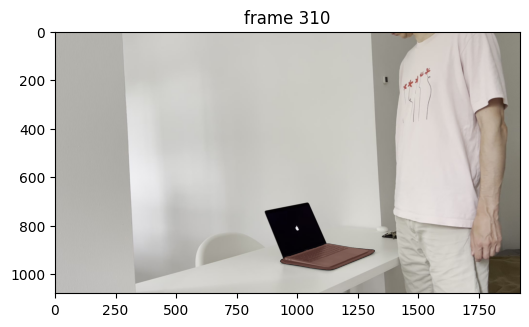

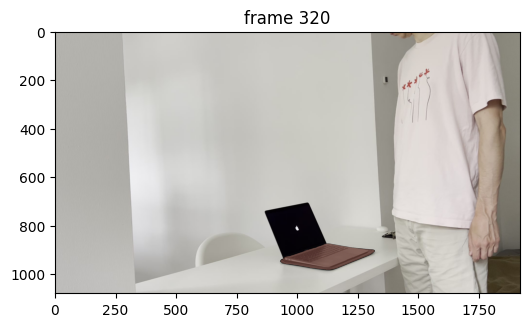

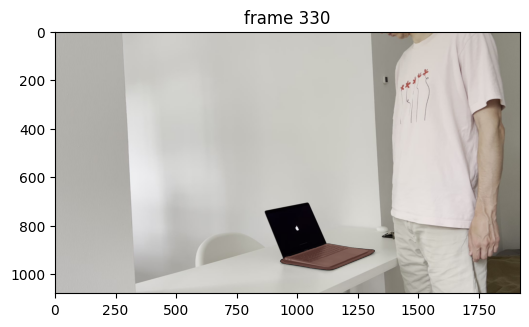

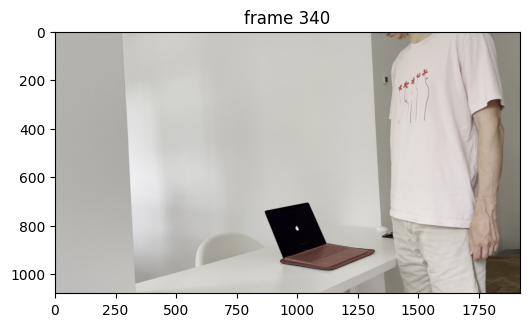

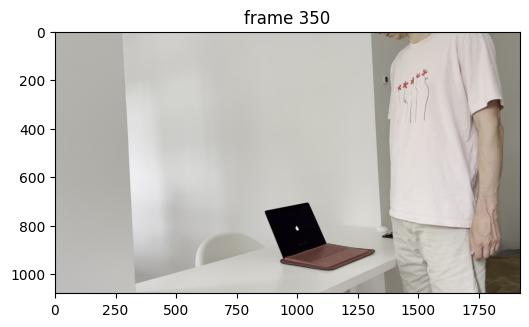

In [35]:
# render the segmentation results every few frames
filt_video_segments = filter_segments_by_ids(video_segments, [5])
vis_frame_stride = 10
plt.close("all")
for out_frame_idx in range(0, len(filt_video_segments), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in filt_video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)